# Solar Energy Storage Project

## Problem:

Find the best location of the three selected areas in the United States where we can best predict the GHI (Global Horizontal Irradiation), key indicator for energy storage potential, with weather indicators of the past 20 years to be able to install solar panels. These points were selected by the company based on historical average values of GHI, and land availability and cost. The data is provided by NASA of the POWER Project over the past 20 years with an hourly frequency.

## Data:


### About the Power project: 

NASA's goal in Earth science is to observe, understand, and model the Earth system to discover how it is changing, to better predict change, and to understand the consequences for life on Earth. The Applied Sciences Program, within the Science Mission Directorate (which replaced both the Office of Earth Science and the Office of Space Science), serves NASA and Society by expanding and accelerating the realization of societal and economic benefits from Earth science, information, and technology research and development.

The Prediction Of Worldwide Energy Resources (POWER) project was initiated to improve upon the current renewable energy data set and to create new data sets from new satellite systems. The POWER project targets three user communities: (1) Renewable Energy, (2) Sustainable Buildings, and (3) Agroclimatology.


### Locations selected:

Lat/Lat of Selected Locations in US:

South Arizona:        32.7805 / -112.8105

South California:     33.3146 / -115.2055

South New Mexico:     32.3175 / -107.7129      



### Variables included:

ALLSKY_SFC_SW_DWN (GHI): All Sky Surface Shortwave Downward Irradiance
The total solar irradiance incident (direct plus diffuse) on a horizontal plane at the surface of the earth under all sky conditions. An alternative term for the total solar irradiance is the "Global Horizontal Irradiance" or GHI.

CLRSKY_SFC_PAR_TOT: Clear Sky Surface PAR Total
The total Photosynthetically Active Radiation (PAR) incident on a horizontal plane at the surface of the earth under clear sky conditions.

CLRSKY_SFC_SW_DWN: Clear Sky Surface Shortwave Downward Irradiance
The total solar irradiance incident (direct plus diffuse) on a horizontal plane at the surface of the earth under clear sky conditions. An alternative term for the total solar irradiance is the "Global Horizontal Irradiance" or GHI.

WS2M: Wind Speed at 2 Meters
The average of wind speed at 2 meters above the surface of the earth.

T2M: Temperature at 2 Meters
The average air (dry bulb) temperature at 2 meters above the surface of the earth.

T2MDEW: Dew/Frost Point at 2 Meters
The dew/frost point temperature at 2 meters above the surface of the earth.

RH2M: Relative Humidity at 2 Meters
The ratio of actual partial pressure of water vapor to the partial pressure at saturation, expressed in percent.

PRECTOTCORR: Precipitation Corrected
The bias corrected average of total precipitation at the surface of the earth in water mass (includes water content in snow).

PS: Surface Pressure
The average of surface pressure at the surface of the earth.

WS10M: Wind Speed at 10 Meters
The average of wind speed at 10 meters above the surface of the earth.

WS50M: Wind Speed at 50 Meters
The average of wind speed at 50 meters above the surface of the earth.



Link: https://power.larc.nasa.gov/data-access-viewer/

In [28]:
#import pandas, numpy, matlab, seaborn

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import tables

warnings.filterwarnings('ignore')


# EDA (Exploratory Data Analysis)

## Summarize the data visually

In [144]:
# Import data from previous Data Wrangling step

df = pd.read_csv('df.csv')
df.tail()

,DATE,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_PAR_TOT,CLRSKY_SFC_SW_DWN,WS2M,STATE,T2M,T2MDEW,RH2M,PRECTOTCORR,PS,WS10M,WS50M
514942,2023-06-30 12:00:00,980.79,464.90,1051.88,6.07,NewMexico,36.29,-5.04,6.69,0.0,85.29,7.71,8.81
514943,2023-06-30 13:00:00,978.60,443.92,1006.42,5.96,NewMexico,36.76,-5.50,6.25,0.0,85.24,7.57,8.70
514944,2023-06-30 14:00:00,844.90,397.58,901.65,5.86,NewMexico,36.94,-5.95,5.94,0.0,85.19,7.45,8.59
514945,2023-06-30 15:00:00,745.97,329.98,747.88,5.69,NewMexico,36.67,-6.56,5.69,0.0,85.13,7.29,8.43
514946,2023-06-30 16:00:00,554.11,243.30,551.77,5.43,NewMexico,35.89,-7.12,5.69,0.0,85.10,7.02,8.17


In [145]:
df.describe()

,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_PAR_TOT,CLRSKY_SFC_SW_DWN,WS2M,T2M,T2MDEW,RH2M,PRECTOTCORR,PS,WS10M,WS50M
count,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000,514947.000000
mean,246.252442,118.019928,267.539960,2.619715,20.455480,1.736003,35.058333,0.019304,93.188626,3.770207,5.410988
std,322.878591,152.053122,342.871392,1.648726,10.686054,8.332213,21.103906,0.125816,5.568077,2.048560,2.754415
min,0.000000,0.000000,0.000000,0.010000,-15.770000,-25.220000,1.440000,0.000000,83.460000,0.010000,0.000000
25%,0.000000,0.000000,0.000000,1.380000,12.260000,-4.510000,18.190000,0.000000,85.640000,2.400000,3.330000
50%,13.620000,4.500000,12.270000,2.180000,20.240000,1.090000,30.940000,0.000000,96.350000,3.380000,5.120000
75%,499.385000,246.580000,559.520000,3.490000,28.430000,7.880000,47.940000,0.000000,97.450000,4.690000,7.210000
max,1084.630000,471.120000,1113.900000,14.810000,50.220000,25.850000,100.000000,7.220000,99.820000,19.860000,24.240000


In [146]:
# Find how many have null values

df.isna().sum()

DATE                  0
ALLSKY_SFC_SW_DWN     0
CLRSKY_SFC_PAR_TOT    0
CLRSKY_SFC_SW_DWN     0
WS2M                  0
STATE                 0
T2M                   0
T2MDEW                0
RH2M                  0
PRECTOTCORR           0
PS                    0
WS10M                 0
WS50M                 0
dtype: int64

In [147]:
# Set the DATE column as the index of the DataFrame

df.set_index("DATE", inplace=True)


In [148]:
df.tail()

,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_PAR_TOT,CLRSKY_SFC_SW_DWN,WS2M,STATE,T2M,T2MDEW,RH2M,PRECTOTCORR,PS,WS10M,WS50M
DATE,,,,,,,,,,,,
2023-06-30 12:00:00,980.79,464.90,1051.88,6.07,NewMexico,36.29,-5.04,6.69,0.0,85.29,7.71,8.81
2023-06-30 13:00:00,978.60,443.92,1006.42,5.96,NewMexico,36.76,-5.50,6.25,0.0,85.24,7.57,8.70
2023-06-30 14:00:00,844.90,397.58,901.65,5.86,NewMexico,36.94,-5.95,5.94,0.0,85.19,7.45,8.59
2023-06-30 15:00:00,745.97,329.98,747.88,5.69,NewMexico,36.67,-6.56,5.69,0.0,85.13,7.29,8.43
2023-06-30 16:00:00,554.11,243.30,551.77,5.43,NewMexico,35.89,-7.12,5.69,0.0,85.10,7.02,8.17


In [149]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 514947 entries, 2003-11-30 16:00:00 to 2023-06-30 16:00:00
Data columns (total 12 columns):
 #   Column              Non-Null Count   Dtype  
---  ------              --------------   -----  
 0   ALLSKY_SFC_SW_DWN   514947 non-null  float64
 1   CLRSKY_SFC_PAR_TOT  514947 non-null  float64
 2   CLRSKY_SFC_SW_DWN   514947 non-null  float64
 3   WS2M                514947 non-null  float64
 4   STATE               514947 non-null  object 
 5   T2M                 514947 non-null  float64
 6   T2MDEW              514947 non-null  float64
 7   RH2M                514947 non-null  float64
 8   PRECTOTCORR         514947 non-null  float64
 9   PS                  514947 non-null  float64
 10  WS10M               514947 non-null  float64
 11  WS50M               514947 non-null  float64
dtypes: float64(11), object(1)
memory usage: 51.1+ MB


This is the list of variables' codes and titles:

* ALLSKY_SFC_SW_DWN             All Sky Surface Shortwave Downward Irradiance
* CLRSKY_SFC_PAR_TOT            Clear Sky Surface PAR Total
* ALLSKY_SFC_UV_INDEX           All Sky Surface UV Index
* CLRSKY_SFC_SW_DWN             Clear Sky Surface Shortwave Downward Irradiance
* WS2M                          Wind Speed at 2 Meters
* T2M                           Temperature at 2 Meters
* T2MDEW                        Dew/Frost Point
* RH2M                          Relative Humidity at 2 Meters
* PRECTOTCORR                   Precipitation Corrected
* PS                            Surface Pressure
* WS10M                         Wind Speed at 10 Meters
* WS50M                         Wind Speed at 50 Meters



#### Plot each variable to see if anything stands out visually

In [150]:
# Reset DATE column index

df.reset_index(inplace=True)
df.head()

df['DATE'] = pd.to_datetime(df['DATE'])
df.set_index('DATE', inplace=True)

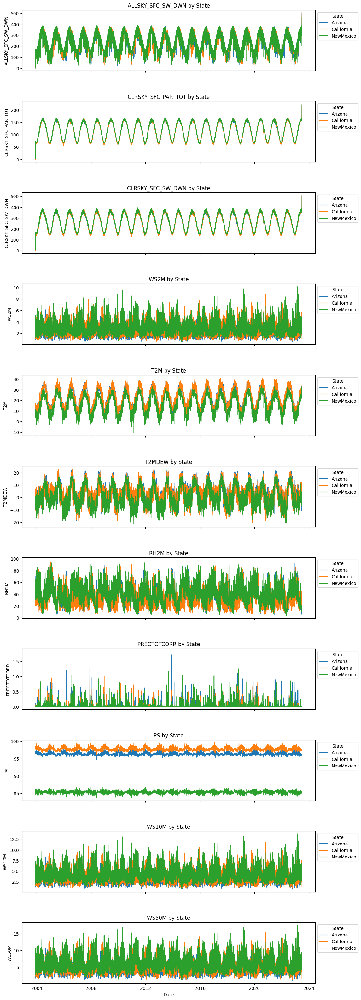

In [152]:
# List of variables
variables = ['ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_PAR_TOT', 'CLRSKY_SFC_SW_DWN', 'WS2M', 'T2M', 'T2MDEW', 'RH2M', 'PRECTOTCORR', 'PS', 'WS10M', 'WS50M']

# Create subplots
fig, axes = plt.subplots(nrows=len(variables), ncols=1, figsize=(12, 40), sharex=True, gridspec_kw={'hspace': 0.5})

# Iterate through each variable
for i, variable in enumerate(variables):
    # Resample data by state and day
    df_resampled = df.groupby(['STATE', pd.Grouper(freq='D')])[variable].mean().reset_index()

    # Plot using Seaborn
    sns.lineplot(x='DATE', y=variable, hue='STATE', data=df_resampled, ax=axes[i])
    
    # Set title and labels
    axes[i].set_title(f'{variable} by State')
    axes[i].set_xlabel('Date')
    axes[i].set_ylabel(variable)
    axes[i].legend(title='State', loc='upper left', bbox_to_anchor=(1, 1))
     
# Adjust layout
plt.tight_layout()
plt.show()


#### Conclusions of plotting charts:

By looking at the charts and summarizing daily there are a few points in the variables: 

ALLSKY_SFC_SW_DWN, CLRSKY_SFC_PAR_TOT, ALLSKY_SFC_UV_INDEX, CLRSKY_SFC_SW_DWN  

that seem incorrect. However, I checked that it is because of the grouping done at the daily basis. If I show the data on an hourly basis, the data points are within expected.



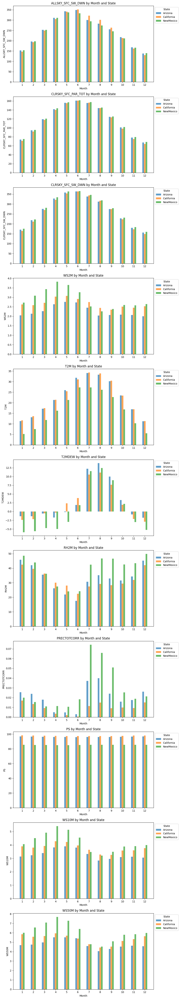

In [155]:
# Since the DATE column is set as index:
df_month_state = df.groupby([df.index.month, 'STATE']).mean()

# Reset the index to make 'DATE' and 'STATE' regular columns
df_month_state = df_month_state.reset_index()
df_month_state.rename(columns={'DATE': 'Month'}, inplace=True)  # Rename the column

# List of variables to plot
variables_to_plot = ['ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_PAR_TOT', 'CLRSKY_SFC_SW_DWN', 'WS2M', 'T2M', 'T2MDEW', 'RH2M', 'PRECTOTCORR', 'PS', 'WS10M', 'WS50M']

# Create subplots
fig, axs = plt.subplots(len(variables_to_plot), 1, figsize=(10, 5 * len(variables_to_plot)))

# Bar width
bar_width = 0.15

# Iterate through variables and plot
for i, variable in enumerate(variables_to_plot):
    for j, (state, group) in enumerate(df_month_state.groupby('STATE')):
        # Adjusting the position for each bar
        pos = group['Month'] + j * bar_width - (len(df_month_state['STATE'].unique()) - 1) * bar_width / 2
        axs[i].bar(pos, group[variable], width=bar_width, label=state, alpha=0.7)

    axs[i].set_xticks(df_month_state['Month'].unique())  # Set x-ticks to be each unique month
    axs[i].set_xticklabels(df_month_state['Month'].unique())  # Set x-tick labels to be each unique month
    axs[i].set_xlabel('Month')
    axs[i].set_ylabel(variable)
    axs[i].set_title(f'{variable} by Month and State')
    axs[i].legend(title='State', loc='upper left', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.show()


By looking at the charts by monthly average of the different indicators there are some conclusions we can make. 

In terms of the GHI indices represented by the first 3 variables, the 3 states have a very similar pattern in the past 20 years. 

New Mexico is by far the windest state of the 3.

Arizona and California are roughly 5 or more celcius degress hotter on average than New Mexico.

New Mexico has the lowest dew/frost point year round with the exception of months of July, August, September and October where California has the lowest dew/frost point.

New Mexico is also the most humid every month on average with the exception of May and June where California is the most humid. 

New Mexico also received the most rain in most months of the year, however Arizona receives more rain than New Mexico from December through March.

Surface pressure is highest for California followed very closely by Arizona. 

In [156]:
# Call the .corr() method on the data
numeric_df = df.select_dtypes(include=['float64', 'int64'])
correlation_matrix = numeric_df.corr()
correlation_matrix

,ALLSKY_SFC_SW_DWN,CLRSKY_SFC_PAR_TOT,CLRSKY_SFC_SW_DWN,WS2M,T2M,T2MDEW,RH2M,PRECTOTCORR,PS,WS10M,WS50M
ALLSKY_SFC_SW_DWN,1.000000,0.982027,0.984203,0.381077,0.518797,-0.042062,-0.491822,0.002808,0.002851,0.207977,-0.139420
CLRSKY_SFC_PAR_TOT,0.982027,1.000000,0.999377,0.388543,0.523667,0.006190,-0.461842,0.053053,-0.011532,0.213328,-0.140459
CLRSKY_SFC_SW_DWN,0.984203,0.999377,1.000000,0.394694,0.514495,-0.013360,-0.468014,0.047645,-0.013911,0.219691,-0.135273
WS2M,0.381077,0.388543,0.394694,1.000000,0.135623,-0.108986,-0.208138,0.039772,-0.134800,0.972320,0.771347
T2M,0.518797,0.523667,0.514495,0.135623,1.000000,0.450336,-0.553546,-0.003708,0.231035,0.009556,-0.189642
T2MDEW,-0.042062,0.006190,-0.013360,-0.108986,0.450336,1.000000,0.422811,0.179559,0.100159,-0.152981,-0.178760
RH2M,-0.491822,-0.461842,-0.468014,-0.208138,-0.553546,0.422811,1.000000,0.197857,-0.142195,-0.131350,0.026221
PRECTOTCORR,0.002808,0.053053,0.047645,0.039772,-0.003708,0.179559,0.197857,1.000000,-0.057137,0.025916,-0.003954
PS,0.002851,-0.011532,-0.013911,-0.134800,0.231035,0.100159,-0.142195,-0.057137,1.000000,-0.162381,-0.182268
WS10M,0.207977,0.213328,0.219691,0.972320,0.009556,-0.152981,-0.131350,0.025916,-0.162381,1.000000,0.886322


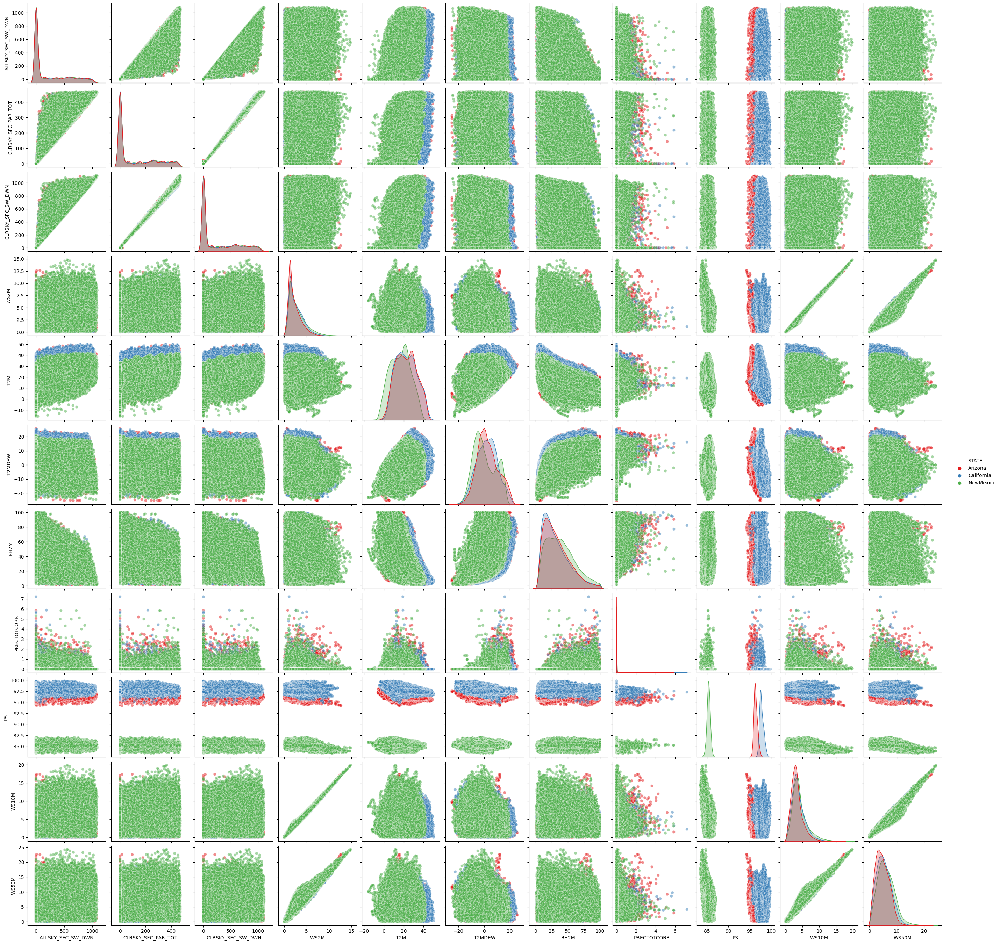

In [180]:
# Make a pairplot of the data
df.reset_index(drop=True, inplace=True)
_ = sns.pairplot(df, hue='STATE', palette='Set1', plot_kws={'alpha': 0.5})
plt.show()

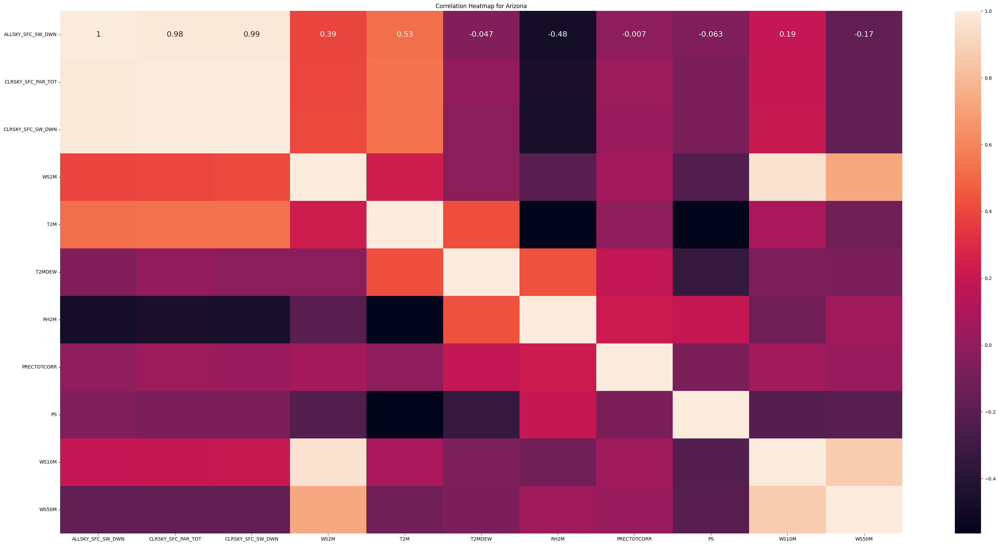

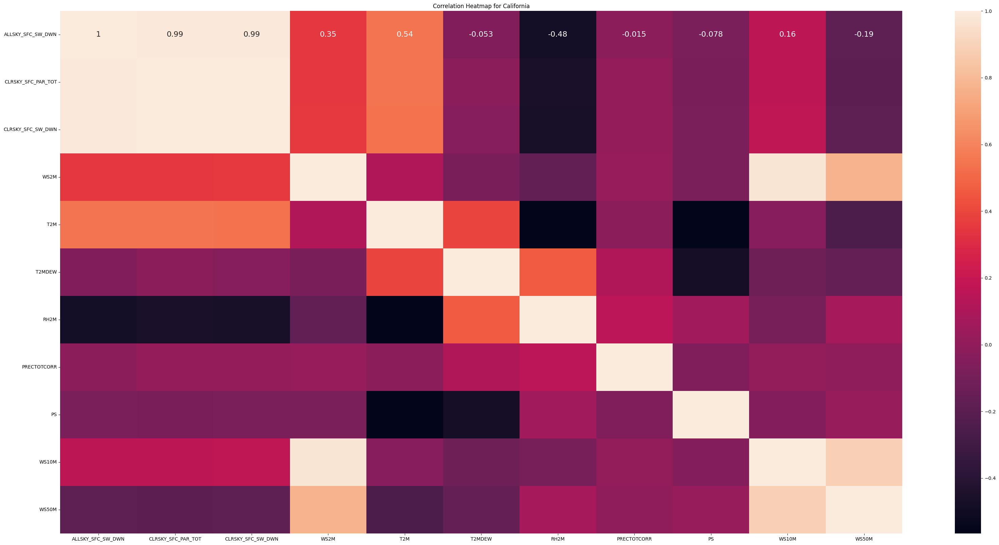

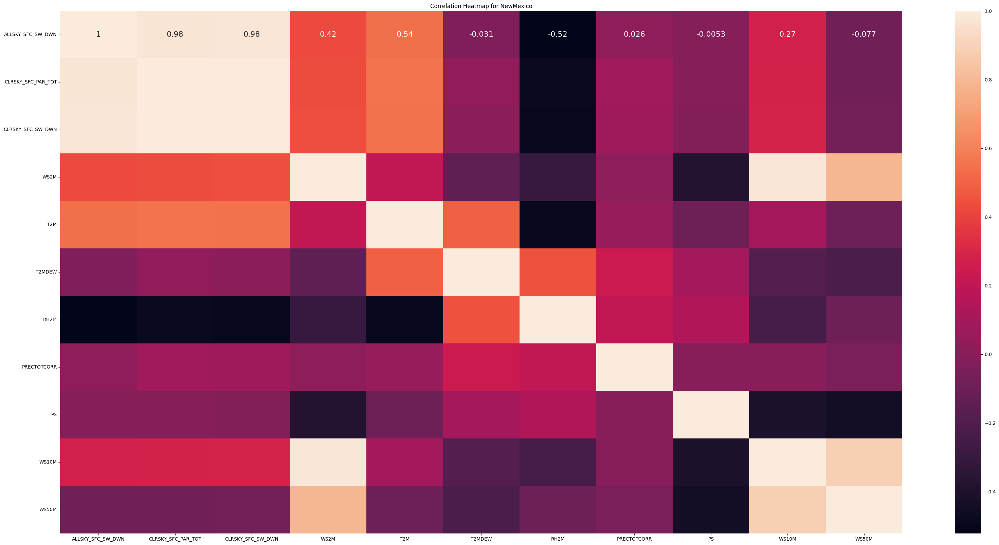

In [172]:
# Make a heatmap of the data 

states = df['STATE'].unique()

# Loop through each state
for state in states:
    # Subset the DataFrame for the current state and exclude non-numeric columns
    df_state = df[df['STATE'] == state].select_dtypes(include=[np.number])
    
    plt.figure(figsize=(40,20))
    sns.heatmap(df_state.corr(), annot=True, annot_kws={"size": 16})#, cmap="coolwarm")
    plt.title(f'Correlation Heatmap for {state}')
    plt.show()




Conclusions!!!

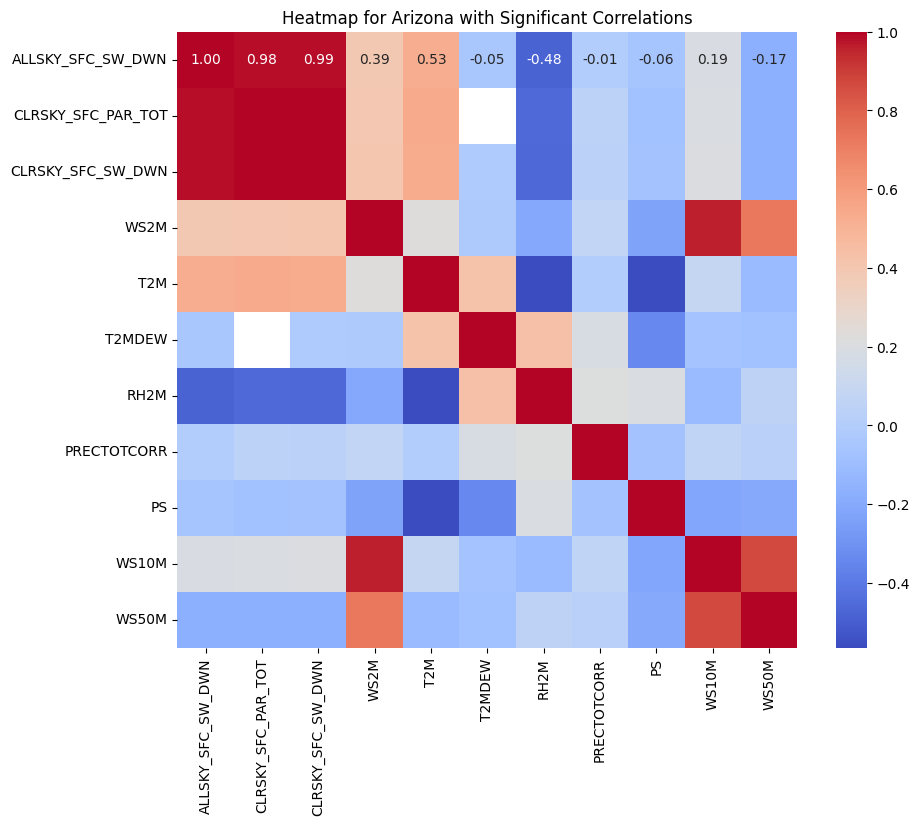

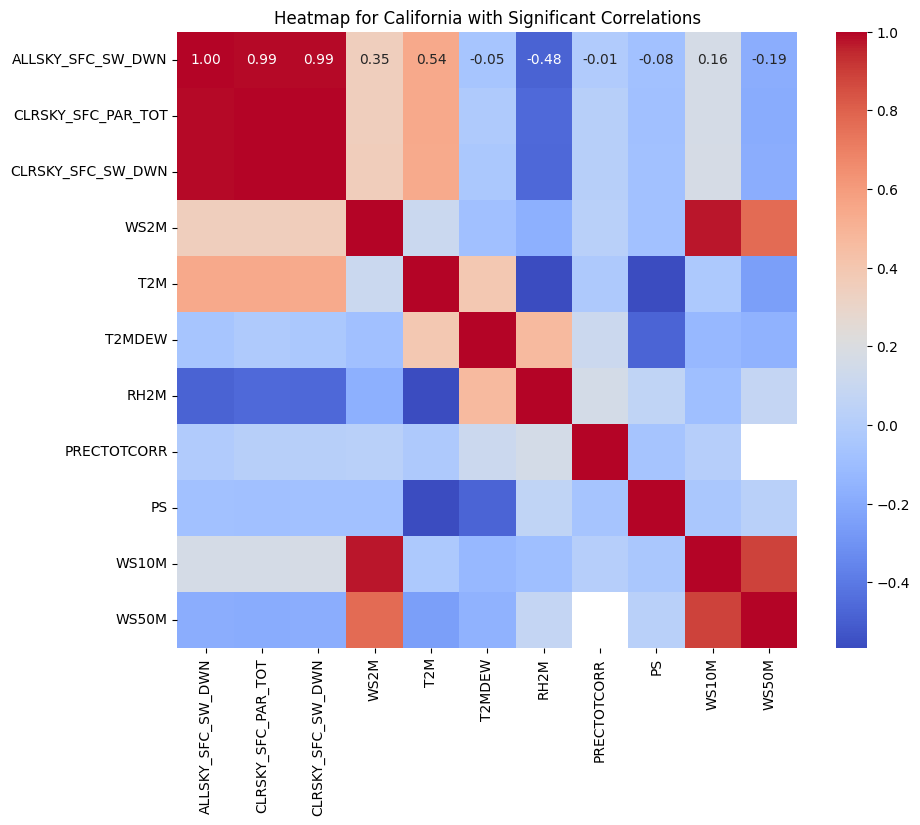

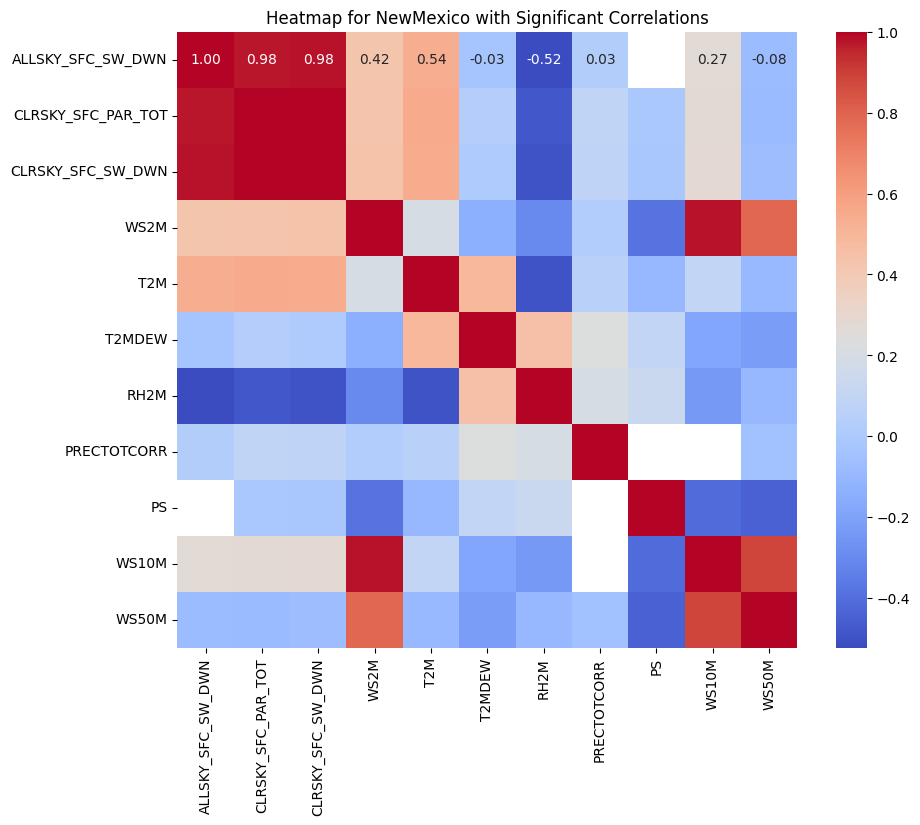

In [179]:


from scipy.stats import pearsonr

# Create a list of unique states
states = df['STATE'].unique()

# Set a significance level
alpha = 0.01

# Loop through each state
for state in states:
    # Subset the DataFrame for the current state and exclude non-numeric columns
    df_state = df[df['STATE'] == state].select_dtypes(include=[np.number])

    # Create a DataFrame of correlation coefficients and p-values
    corr_matrix = df_state.corr()
    p_values = pd.DataFrame(np.zeros_like(corr_matrix), columns=corr_matrix.columns, index=corr_matrix.index)

    # Loop through each pair of variables
    for col1 in df_state.columns:
        for col2 in df_state.columns:
            # Calculate correlation coefficient and p-value
            corr, p_value = pearsonr(df_state[col1], df_state[col2])
            corr_matrix.loc[col1, col2] = corr
            p_values.loc[col1, col2] = p_value

    # Create a mask for significant correlations
    mask = (p_values < alpha)

    # Create a heatmap using seaborn
    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", mask=~mask)
    plt.title(f"Heatmap for {state} with Significant Correlations")
    plt.show()


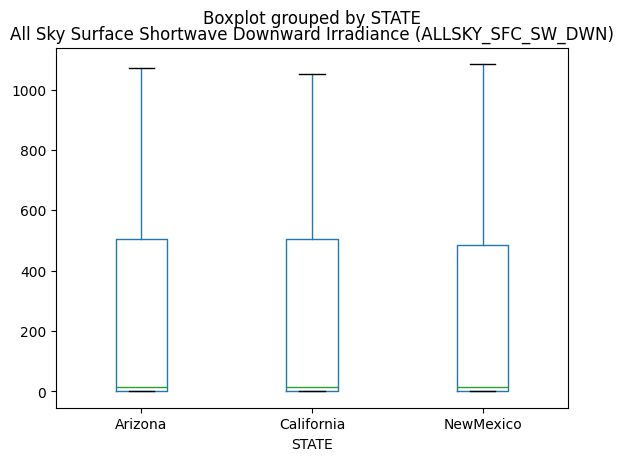

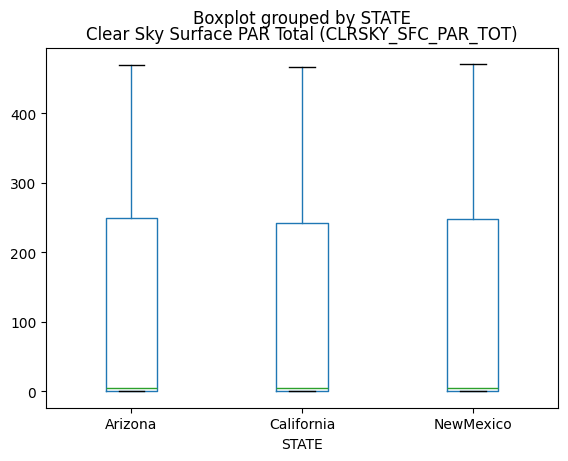

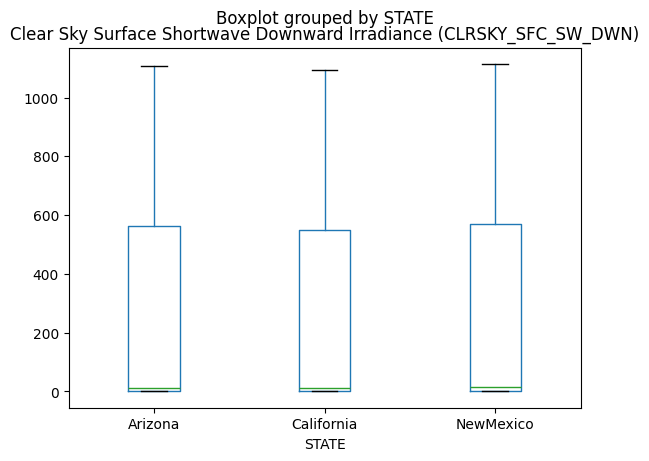

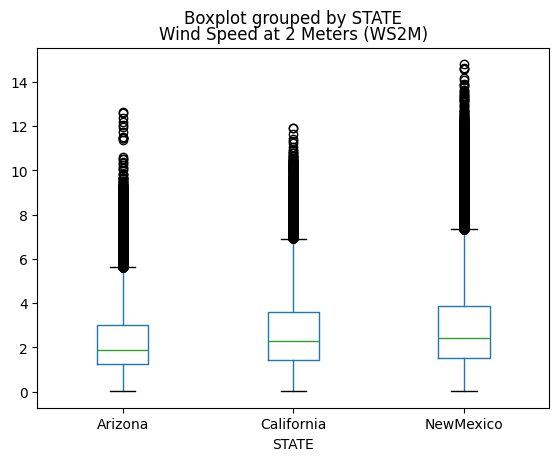

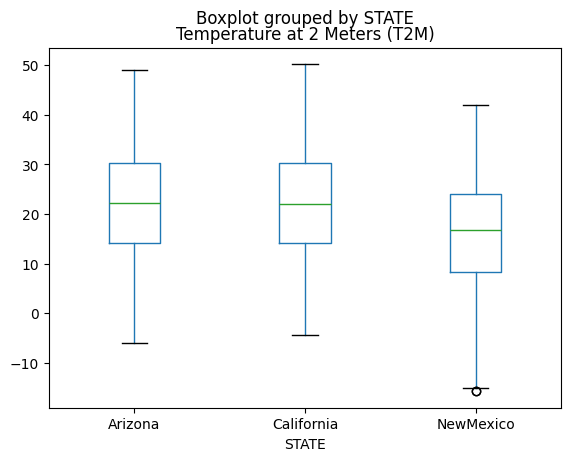

...

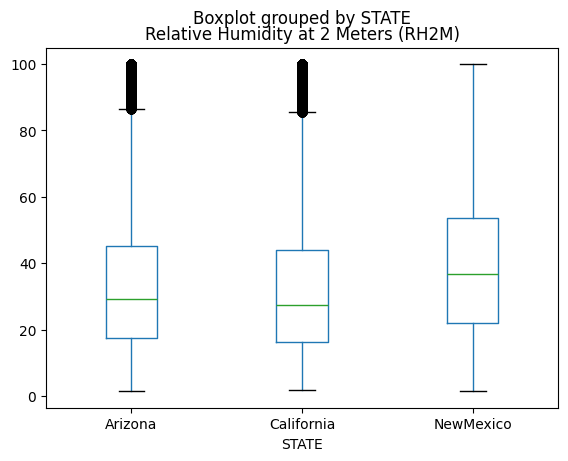

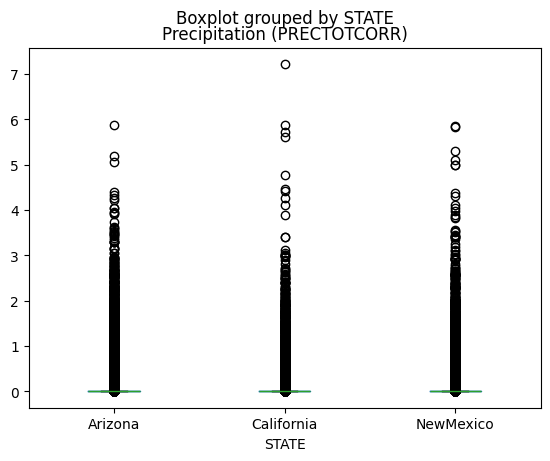

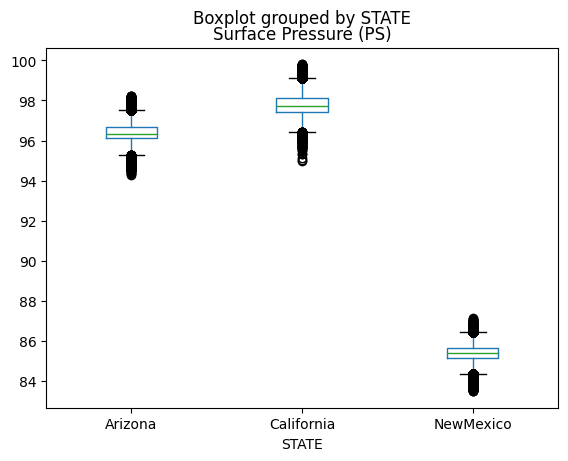

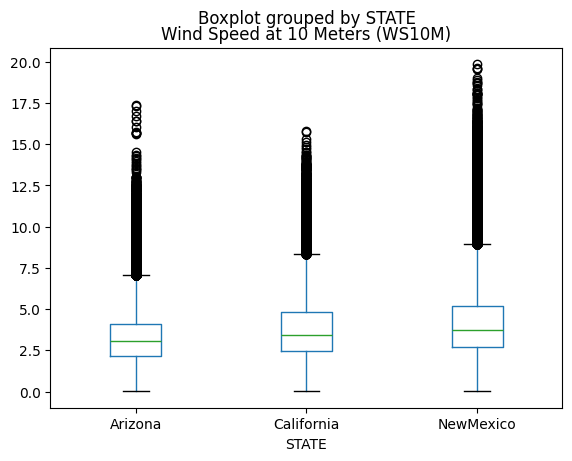

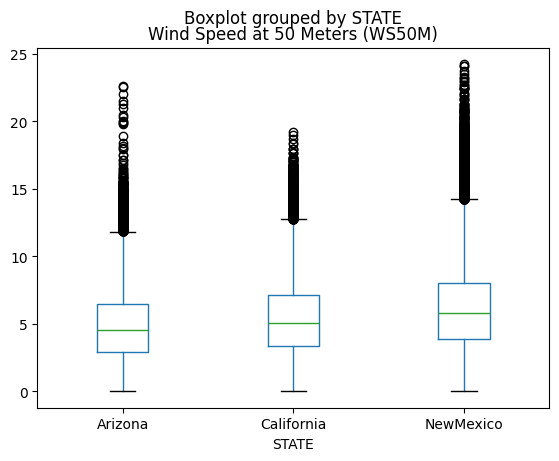

In [161]:


import matplotlib.pyplot as plt
# Call the boxplot() method on our df.
_ = df.boxplot(by='STATE', column='ALLSKY_SFC_SW_DWN', grid=False, fontsize=10)
plt.title("All Sky Surface Shortwave Downward Irradiance (ALLSKY_SFC_SW_DWN)")
_ = df.boxplot(by='STATE', column='CLRSKY_SFC_PAR_TOT', grid=False, fontsize=10)
plt.title("Clear Sky Surface PAR Total (CLRSKY_SFC_PAR_TOT)")
_ = df.boxplot(by='STATE', column='CLRSKY_SFC_SW_DWN', grid=False, fontsize=10)
plt.title("Clear Sky Surface Shortwave Downward Irradiance (CLRSKY_SFC_SW_DWN)")
_ = df.boxplot(by='STATE', column='WS2M', grid=False, fontsize=10)
plt.title("Wind Speed at 2 Meters (WS2M)")
_ = df.boxplot(by='STATE', column='T2M', grid=False, fontsize=10)
plt.title("Temperature at 2 Meters (T2M)")
_ = df.boxplot(by='STATE', column='T2MDEW', grid=False, fontsize=10)
plt.title("Dew/Frost Point at 2 Meters (T2MDEW)")
_ = df.boxplot(by='STATE', column='RH2M', grid=False, fontsize=10)
plt.title("Relative Humidity at 2 Meters (RH2M)")
_ = df.boxplot(by='STATE', column='PRECTOTCORR', grid=False, fontsize=10)
plt.title("Precipitation (PRECTOTCORR)")
_ = df.boxplot(by='STATE', column='PS', grid=False, fontsize=10)
plt.title("Surface Pressure (PS)")
_ = df.boxplot(by='STATE', column='WS10M', grid=False, fontsize=10)
plt.title("Wind Speed at 10 Meters (WS10M)")
_ = df.boxplot(by='STATE', column='WS50M', grid=False, fontsize=10)
plt.title("Wind Speed at 50 Meters (WS50M)")
plt.show()

#### Check for duplicates

In [181]:
# Check for duplicates across all columns
duplicates_all = df[df.duplicated()]

columns_to_check_duplicates = ['ALLSKY_SFC_SW_DWN', 'CLRSKY_SFC_PAR_TOT', 'CLRSKY_SFC_SW_DWN', 'WS2M', 'STATE', 'T2M', 'T2MDEW', 'RH2M', 'PRECTOTCORR', 'PS', 'WS10M', 'WS50M']
duplicates_subset = df[df.duplicated(subset=columns_to_check_duplicates)]

# Display the results
print("Duplicates across all columns:")
print(duplicates_all)

print("\nDuplicates based on specific columns:")
print(duplicates_subset)


Duplicates across all columns:
Empty DataFrame
Columns: [ALLSKY_SFC_SW_DWN, CLRSKY_SFC_PAR_TOT, CLRSKY_SFC_SW_DWN, WS2M, STATE, T2M, T2MDEW, RH2M, PRECTOTCORR, PS, WS10M, WS50M]
Index: []

Duplicates based on specific columns:
Empty DataFrame
Columns: [ALLSKY_SFC_SW_DWN, CLRSKY_SFC_PAR_TOT, CLRSKY_SFC_SW_DWN, WS2M, STATE, T2M, T2MDEW, RH2M, PRECTOTCORR, PS, WS10M, WS50M]
Index: []


### Conclusion of the EDA

Looking through the different information and graphs created, I would like to predict the All Sky Surface Shortwave Downward Irradiance (ALLSKY_SFC_SW_DWN) and drop the other 2 variables that have very high correlations that basically show the same information, those variables are CLRSKY_SFC_PAR_TOT and CLRSKY_SFC_SW_DWN. Then interesting indices arrived from analyzing the charts would be temperature (T2M), wind speed (WS2M) and humiidity (RH2M). 


In [183]:
# Save DataFrame to a CSV file after data EDA process:

df.to_csv('df_EDA.csv', index=True)